In [ ]:
!nvidia-smi

Sat Jan 20 16:08:16 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   61C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/Academic/Final Defense/UBL POSM

/content/drive/MyDrive/Academic/Final Defense/UBL POSM


## Install YOLOv8

⚠️ YOLOv8 is still under heavy development. Breaking changes are being introduced almost weekly. We strive to make our YOLOv8 notebooks work with the latest version of the library. Last tests took place on **18.01.2023** with version **YOLOv8.0.9**.

If you notice that our notebook behaves incorrectly - especially if you experience errors that prevent you from going through the tutorial - don't hesitate! Let us know and open an [issue](https://github.com/roboflow/notebooks/issues) on the Roboflow Notebooks repository.

YOLOv8 can be installed in two ways - from the source and via pip. This is because it is the first iteration of YOLO to have an official package.

In [ ]:
!pip show torch

Name: torch
Version: 2.1.0+cu121
Summary: Tensors and Dynamic neural networks in Python with strong GPU acceleration
Home-page: https://pytorch.org/
Author: PyTorch Team
Author-email: packages@pytorch.org
License: BSD-3
Location: /usr/local/lib/python3.10/dist-packages
Requires: filelock, fsspec, jinja2, networkx, sympy, triton, typing-extensions
Required-by: fastai, torchaudio, torchdata, torchtext, torchvision


In [ ]:
# Pip install method (recommended)

!pip install ultralytics==8.0.20

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu121 CPU
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.3/107.7 GB disk)


In [ ]:
from ultralytics import YOLO
from PIL import Image
from IPython.display import display, Image

## Custom Training

In [ ]:
# %cd /content/drive/MyDrive/UBL POSM
%cd /content/drive/MyDrive/Academic/Final Defense/UBL POSM

/content/drive/MyDrive/Academic/Final Defense/UBL POSM


In [ ]:
!ls

data.yaml				     runs   yolov8l.pt	yolov8n.pt  yolov8x.pt
FInal_defense_Yolov8_object_detection.ipynb  UBL-4  yolov8m.pt	yolov8s.pt


#Apply YOLOv8l model

In [ ]:
%cd /content/drive/MyDrive/Academic/Final Defense/UBL POSM

!yolo task=detect mode=train model=yolov8l.pt data=data.yaml patience=300 epochs=50 imgsz=640 plots=True batch=8

/content/drive/MyDrive/Academic/Final Defense/UBL POSM
100% 83.7M/83.7M [00:00<00:00, 157MB/s]

Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8l.yaml, data=data.yaml, epochs=50, patience=300, batch=8, imgsz=640, save=True, cache=False, device=, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscr

Validate Custom Model for YOLOv8l

In [ ]:
!yolo task=detect mode=val model=runs/detect/train/weights/best.pt data=data.yaml

2024-01-20 17:49:21.750031: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-20 17:49:21.750081: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-20 17:49:21.751312: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-20 17:49:22.869386: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 268 layers, 43613547 parameters, 0 gradients, 164.9 GFLOPs
val: Scanning /content/drive/MyDrive/Academic/Final Defense/UBL POSM/UBL

Inference with Custom Model for YOLOv8l

In [ ]:
!yolo task=detect mode=predict model=runs/detect/train/weights/best.pt conf=0.25 source=UBL-4/test/images

2024-01-20 17:51:49.763308: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-20 17:51:49.763363: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-20 17:51:49.764595: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-20 17:51:50.808315: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 268 layers, 43613547 parameters, 0 gradients, 164.9 GFLOPs
image 1/207 /content/drive/MyDrive/Academic/Final Defense/UBL POSM/UBL-4

Results

In [ ]:
!ls runs/detect/val

confusion_matrix.png  PR_curve.png	     val_batch0_pred.jpg    val_batch2_labels.jpg
F1_curve.png	      R_curve.png	     val_batch1_labels.jpg  val_batch2_pred.jpg
P_curve.png	      val_batch0_labels.jpg  val_batch1_pred.jpg


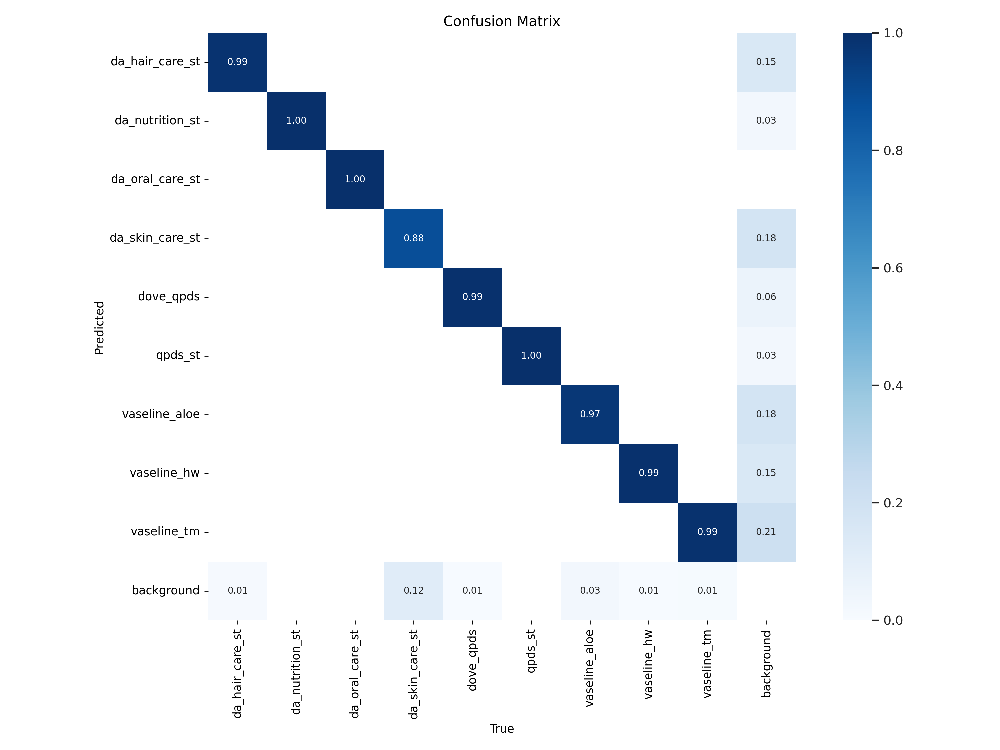

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/val/confusion_matrix.png'
img = Image.open(img_path)
display(img)

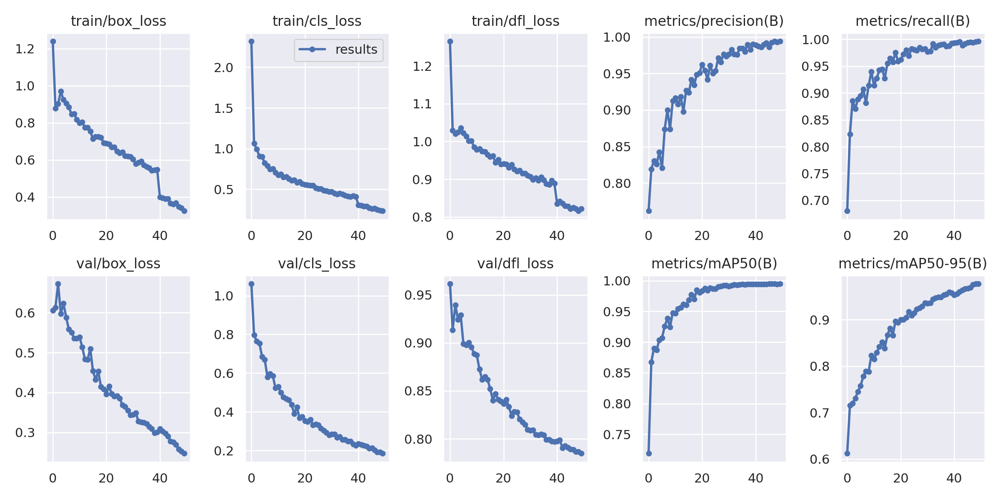

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/train/results.png'
img = Image.open(img_path)
display(img)

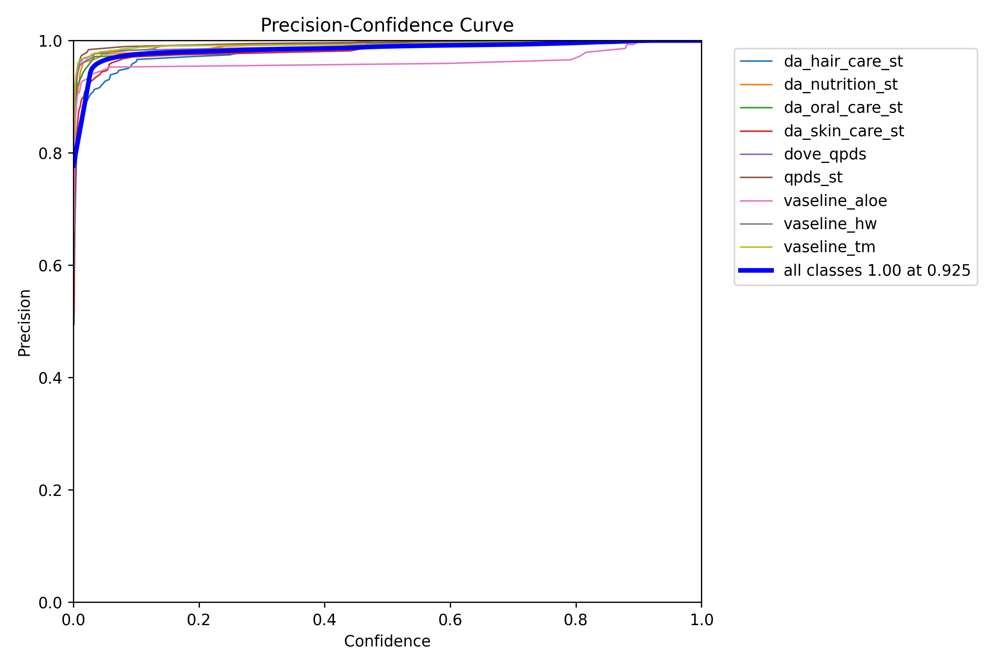

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/val/P_curve.png'
img = Image.open(img_path)
display(img)

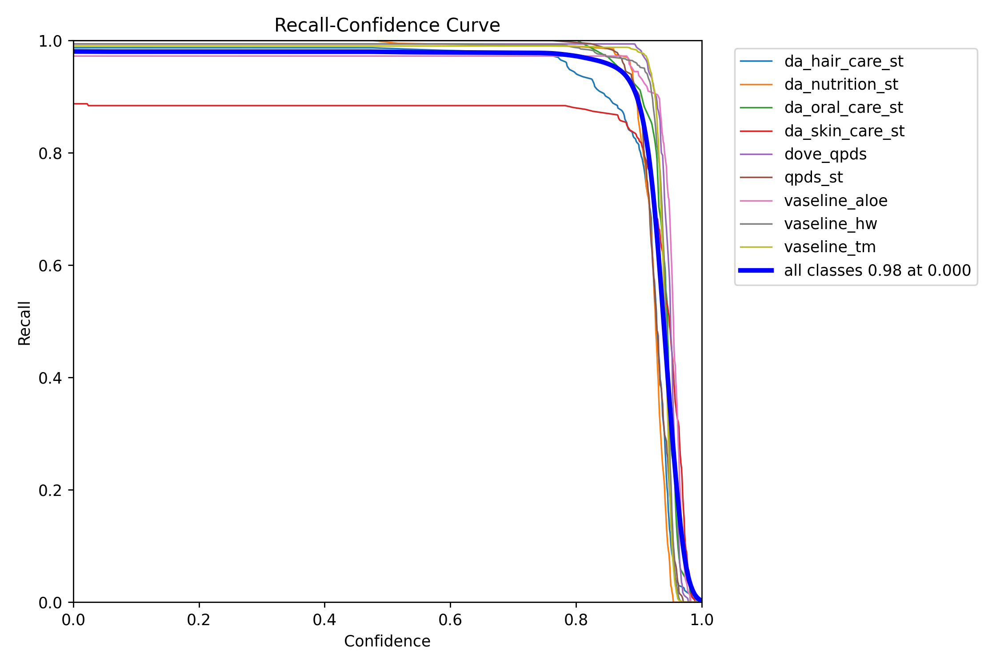

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/val/R_curve.png'
img = Image.open(img_path)
display(img)

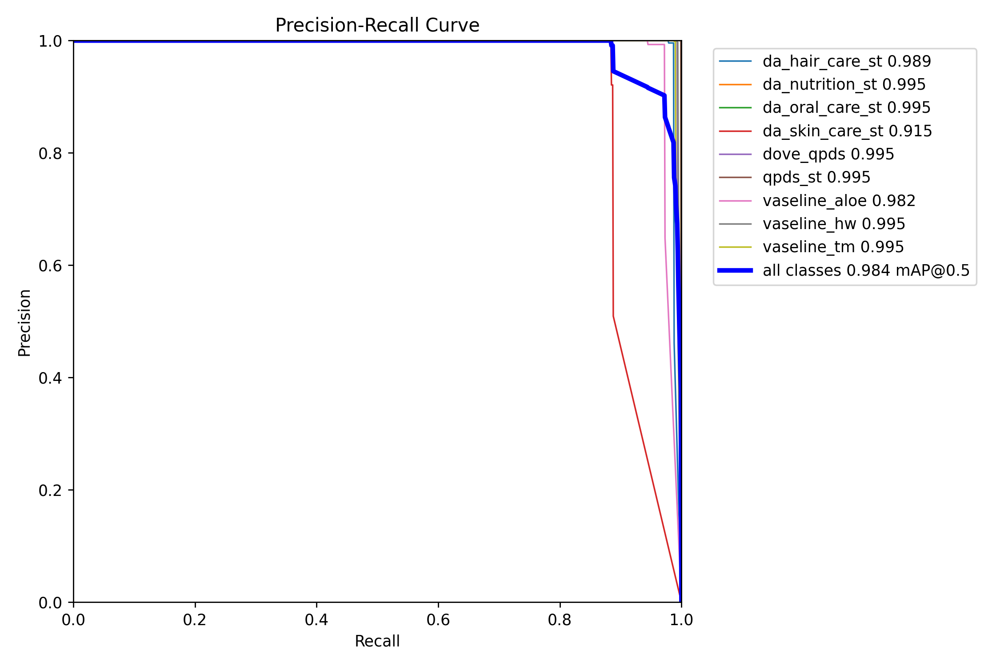

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/val/PR_curve.png'
img = Image.open(img_path)
display(img)

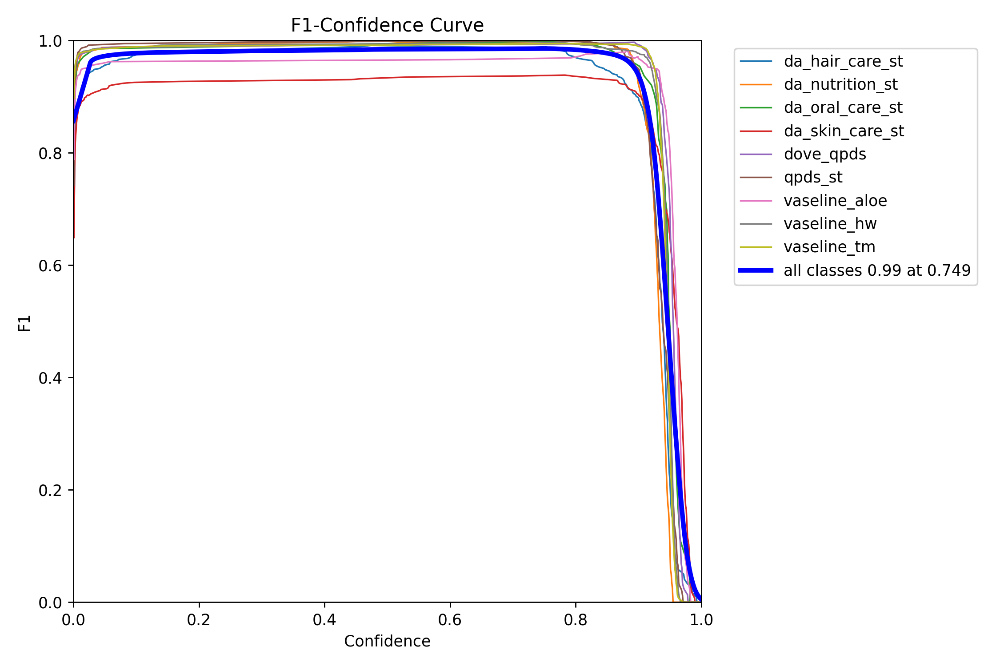

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/val/F1_curve.png'
img = Image.open(img_path)
display(img)

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/val/val_batch1_labels.jpg'
img = Image.open(img_path)
display(img)

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/val/val_batch1_pred.jpg'
img = Image.open(img_path)
display(img)

#Apply YOLOv8x Model

In [ ]:
%cd /content/drive/MyDrive/Academic/Final Defense/UBL POSM

!yolo task=detect mode=train model= yolov8x.pt data=data.yaml patience=300 epochs=50 imgsz=640 plots=True batch=8

/content/drive/MyDrive/Academic/Final Defense/UBL POSM
100% 131M/131M [00:00<00:00, 180MB/s]

Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8x.yaml, data=data.yaml, epochs=50, patience=300, batch=8, imgsz=640, save=True, cache=False, device=, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscrip

Validate Custom Model for YOLOv8x

In [ ]:
!yolo task=detect mode=val model=runs/detect/train2/weights/best.pt data=data.yaml

2024-01-21 08:30:14.335887: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-21 08:30:14.336087: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-21 08:30:14.341539: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-21 08:30:16.391050: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu121 CPU
Model summary (fused): 268 layers, 68132235 parameters, 0 gradients, 257.4 GFLOPs
100% 755k/755k [00:00<00:00, 16.1MB/s]
val: Scanning /content/drive/MyDrive/Academic/Final Defen

Inference with Custom Model for YOLOv8x

In [ ]:
!yolo task=detect mode=predict model=runs/detect/train2/weights/best.pt conf=0.25 source=UBL-4/test/images

2024-01-15 18:24:55.559694: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-15 18:24:55.559752: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-15 18:24:55.560996: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-15 18:24:56.716989: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 268 layers, 68132235 parameters, 0 gradients, 257.4 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/207 /content/drive/MyD

Results

In [ ]:
!ls runs/detect/val2

confusion_matrix.png  PR_curve.png	     val_batch0_pred.jpg    val_batch2_labels.jpg
F1_curve.png	      R_curve.png	     val_batch1_labels.jpg  val_batch2_pred.jpg
P_curve.png	      val_batch0_labels.jpg  val_batch1_pred.jpg


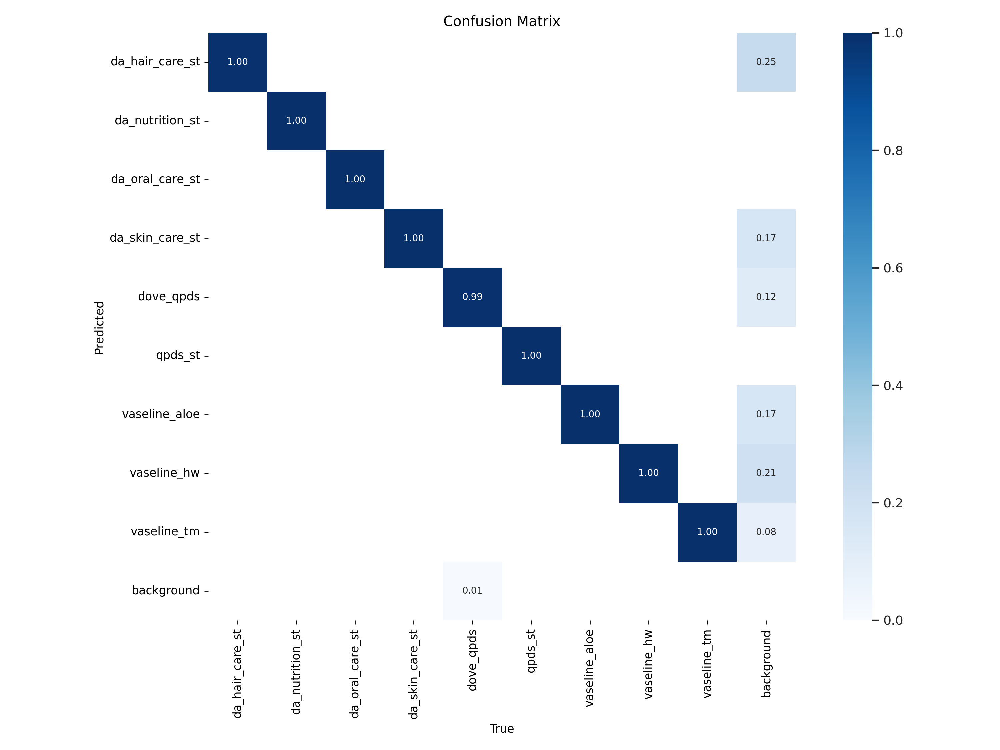

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/val2/confusion_matrix.png'
img = Image.open(img_path)
display(img)

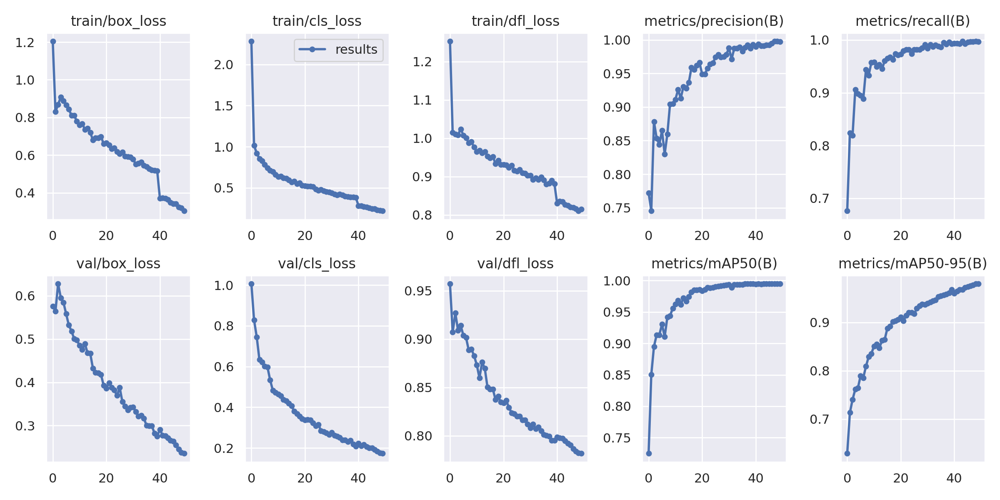

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/train2/results.png'
img = Image.open(img_path)
display(img)

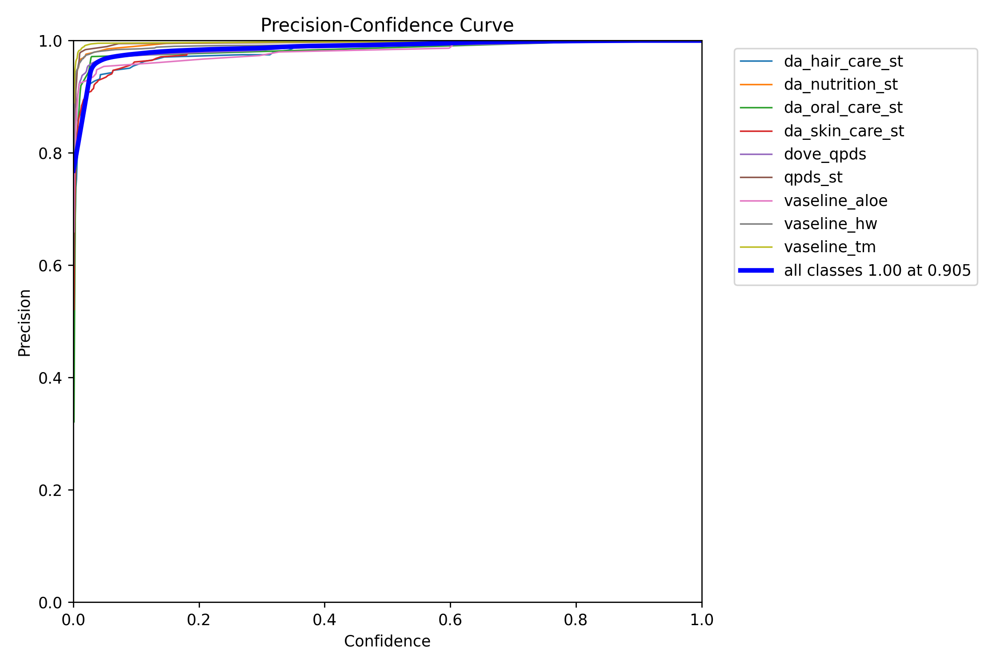

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/val2/P_curve.png'
img = Image.open(img_path)
display(img)

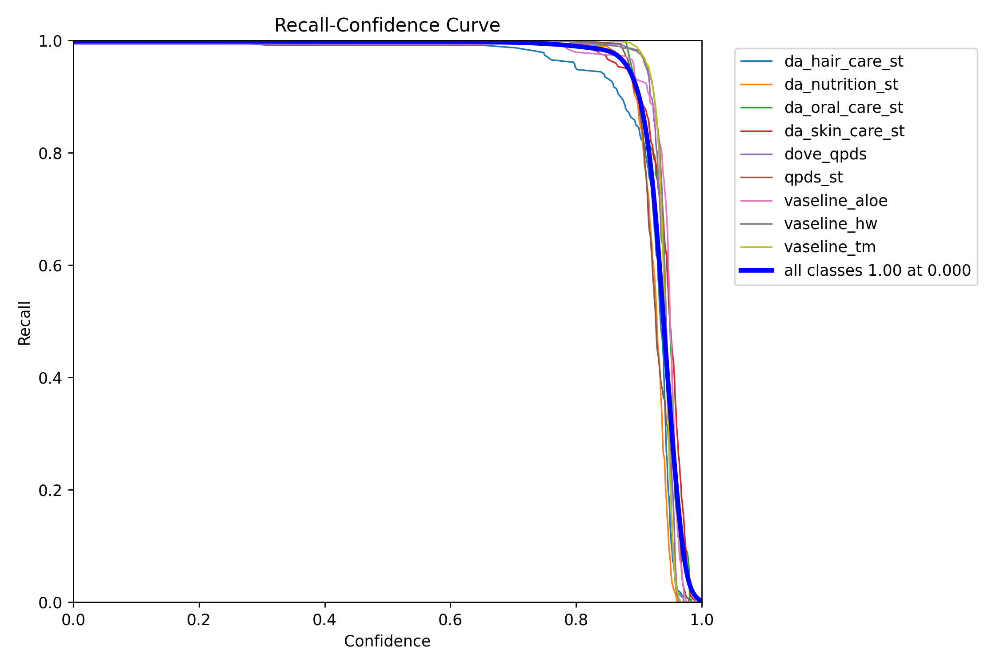

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/val2/R_curve.png'
img = Image.open(img_path)
display(img)

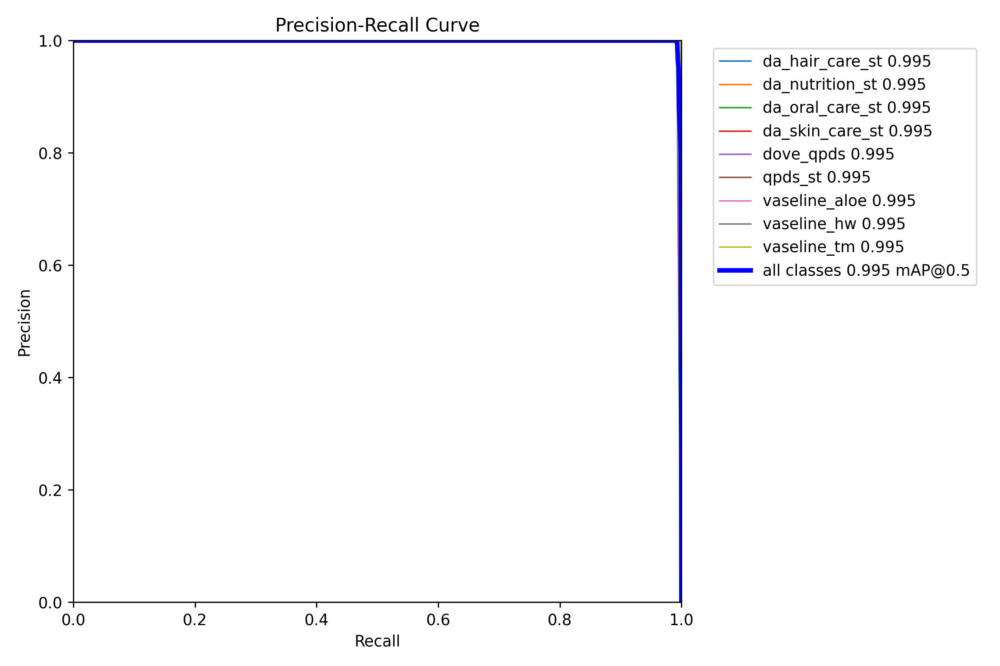

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/val2/PR_curve.png'
img = Image.open(img_path)
display(img)

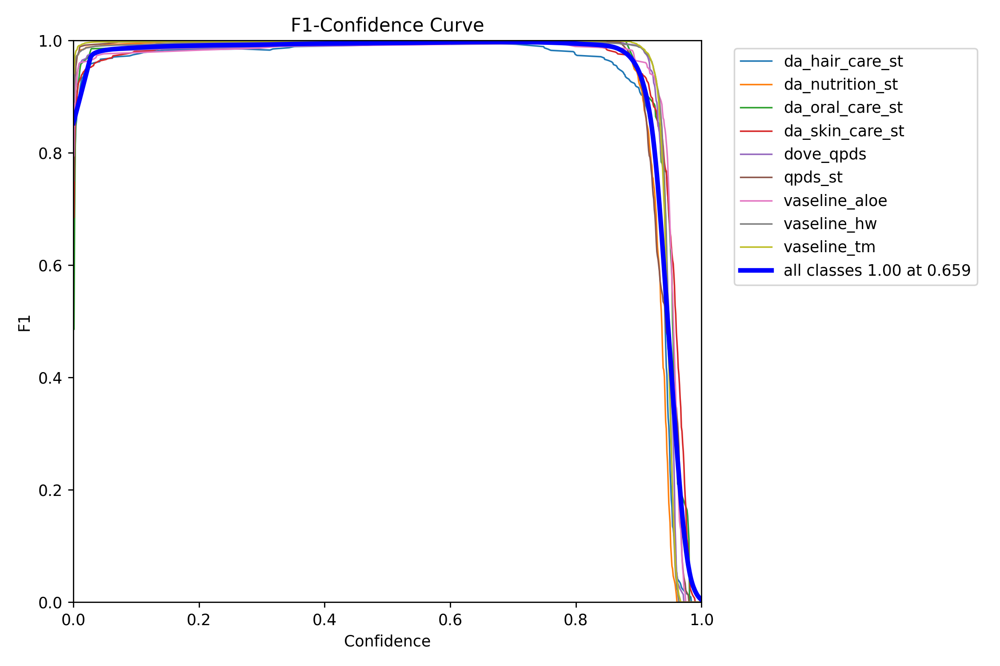

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/val2/F1_curve.png'
img = Image.open(img_path)
display(img)

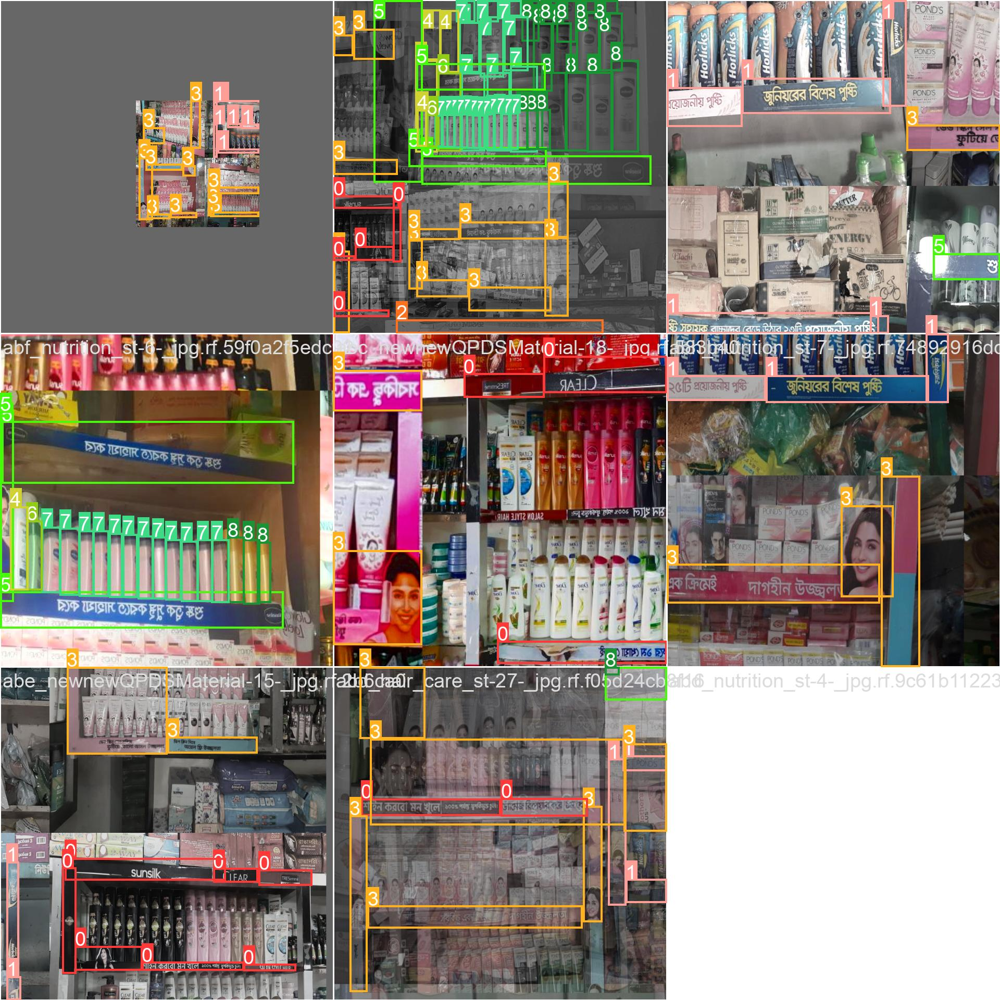

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/train2/train_batch0.jpg'
img = Image.open(img_path)
display(img)

#Apply YOLOv8m Model

In [ ]:
%cd /content/drive/MyDrive/Academic/Final Defense/UBL POSM

!yolo task=detect mode=train model= yolov8m.pt data=data.yaml patience=300 epochs=50 imgsz=640 plots=True batch=8

/content/drive/MyDrive/Academic/Final Defense/UBL POSM
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8m.yaml, data=data.yaml, epochs=50, patience=300, batch=8, imgsz=640, save=True, cache=False, device=, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=Fa

Validate Custom Model for YOLOv8m

In [ ]:
!yolo task=detect mode=val model=runs/detect/train3/weights/best.pt data=data.yaml

2024-01-20 17:58:33.475769: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-20 17:58:33.475829: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-20 17:58:33.477794: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-20 17:58:35.030301: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25844971 parameters, 0 gradients, 78.7 GFLOPs
val: Scanning /content/drive/MyDrive/Academic/Final Defense/UBL POSM/UBL-

Inference with Custom Model for YOLOv8m

In [ ]:
!yolo task=detect mode=predict model=runs/detect/train3/weights/best.pt conf=0.25 source=UBL-4/test/images

2024-01-16 15:16:33.073138: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-16 15:16:33.073211: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-16 15:16:33.075106: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-16 15:16:34.703398: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25844971 parameters, 0 gradients, 78.7 GFLOPs
image 1/207 /content/drive/MyDrive/Academic/Final Defense/UBL POSM/UBL-4/

Results

In [ ]:
!ls runs/detect/val3

confusion_matrix.png  PR_curve.png	     val_batch0_pred.jpg    val_batch2_labels.jpg
F1_curve.png	      R_curve.png	     val_batch1_labels.jpg  val_batch2_pred.jpg
P_curve.png	      val_batch0_labels.jpg  val_batch1_pred.jpg


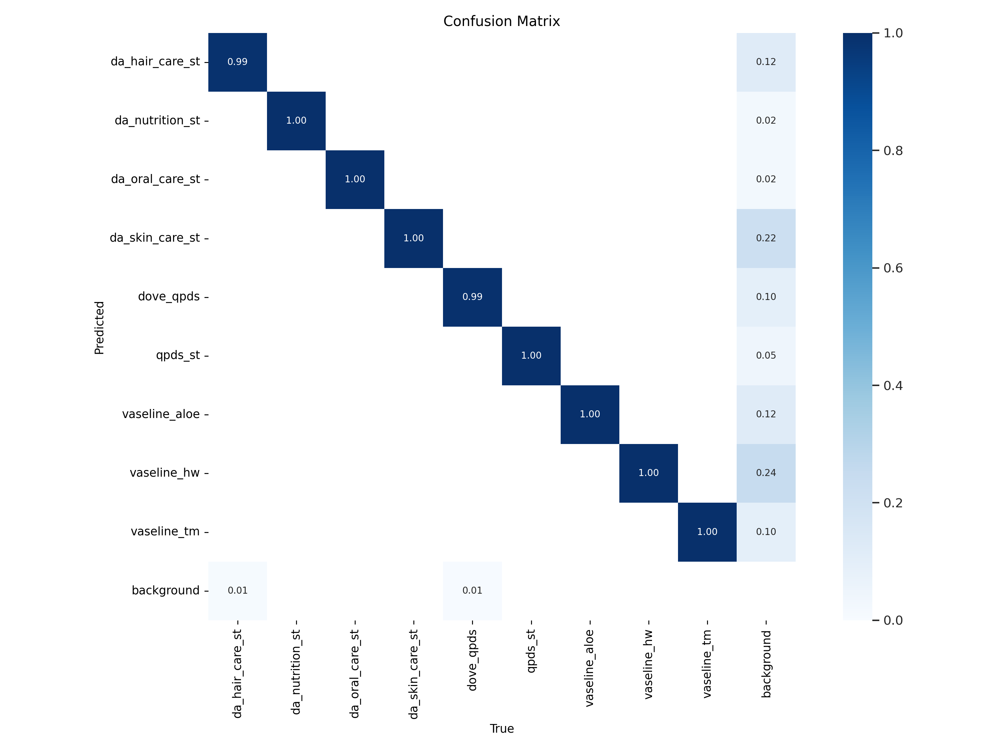

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/val3/confusion_matrix.png'
img = Image.open(img_path)
display(img)

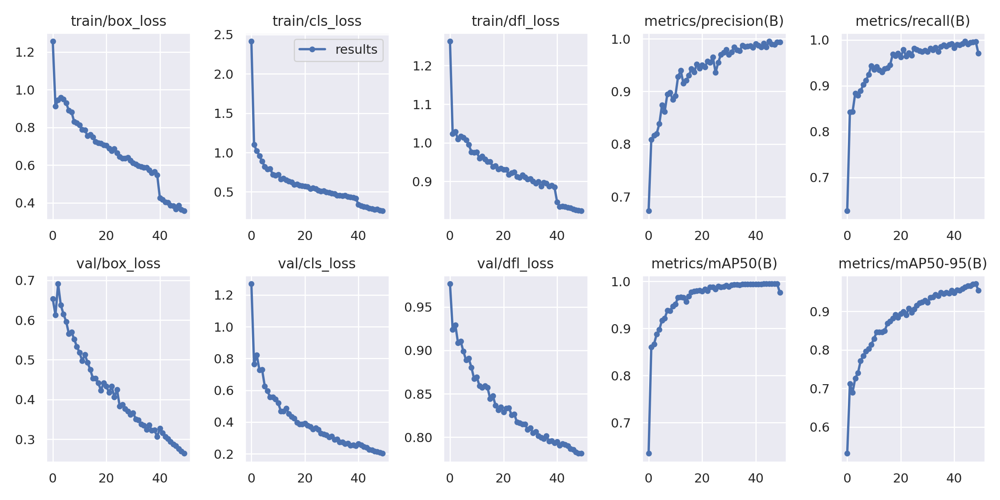

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/train3/results.png'
img = Image.open(img_path)
display(img)

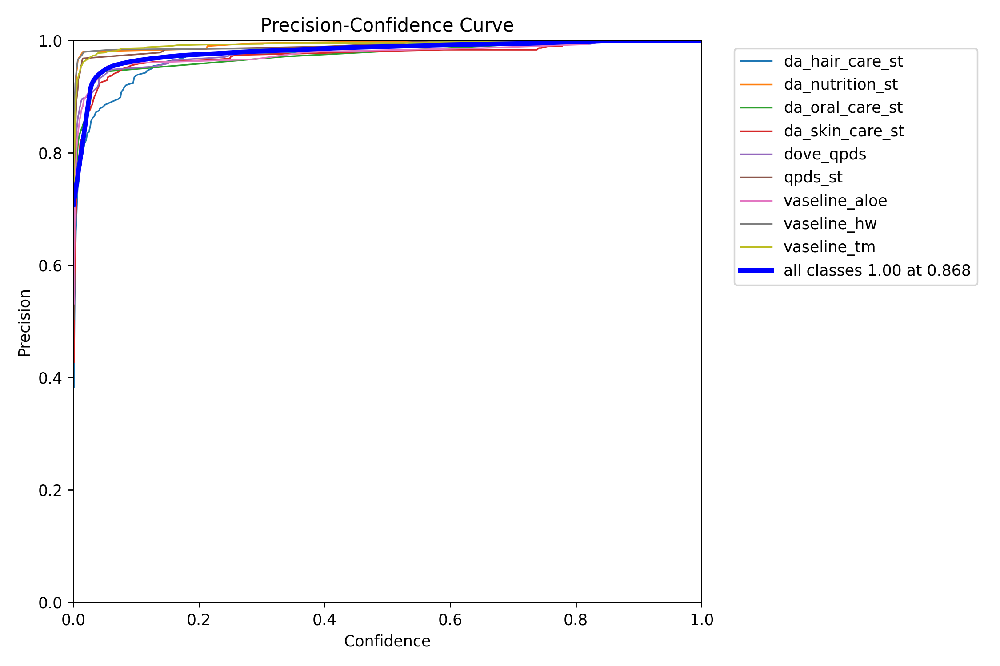

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/val3/P_curve.png'
img = Image.open(img_path)
display(img)

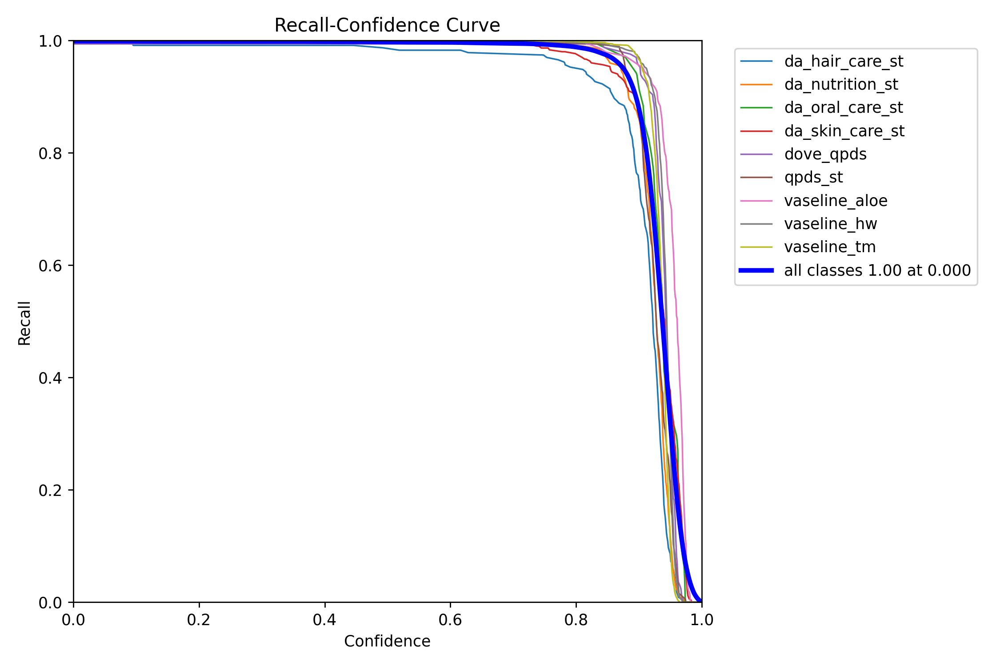

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/val3/R_curve.png'
img = Image.open(img_path)
display(img)

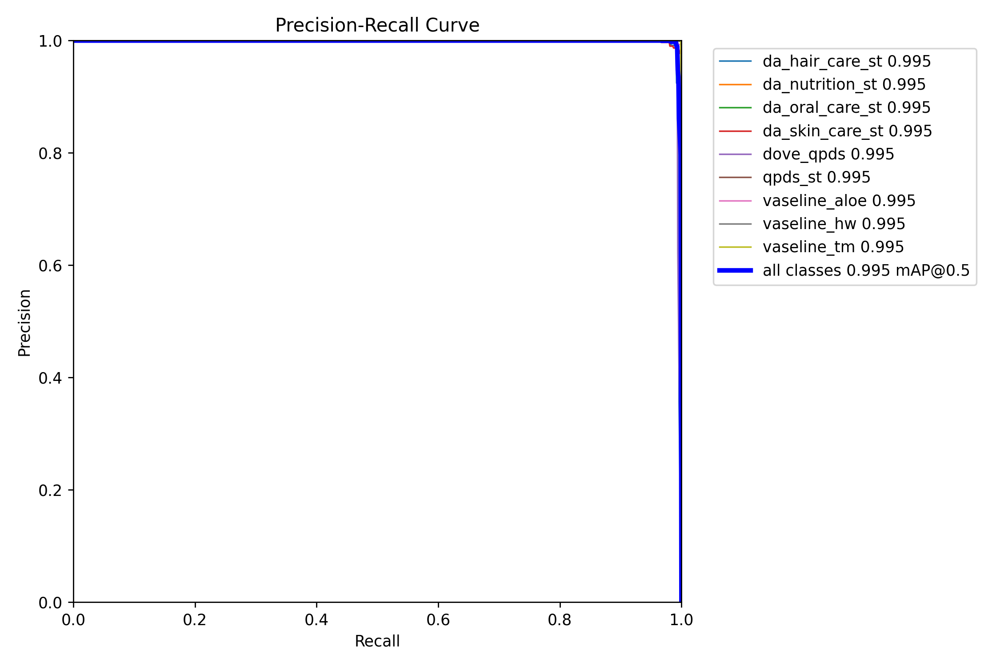

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/val3/PR_curve.png'
img = Image.open(img_path)
display(img)

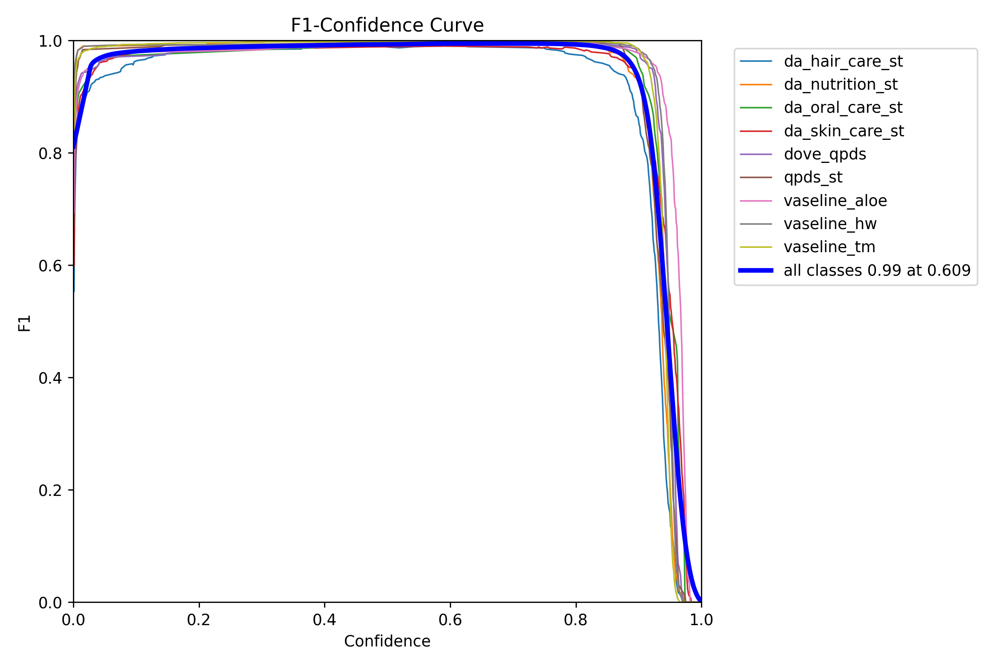

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/val3/F1_curve.png'
img = Image.open(img_path)
display(img)

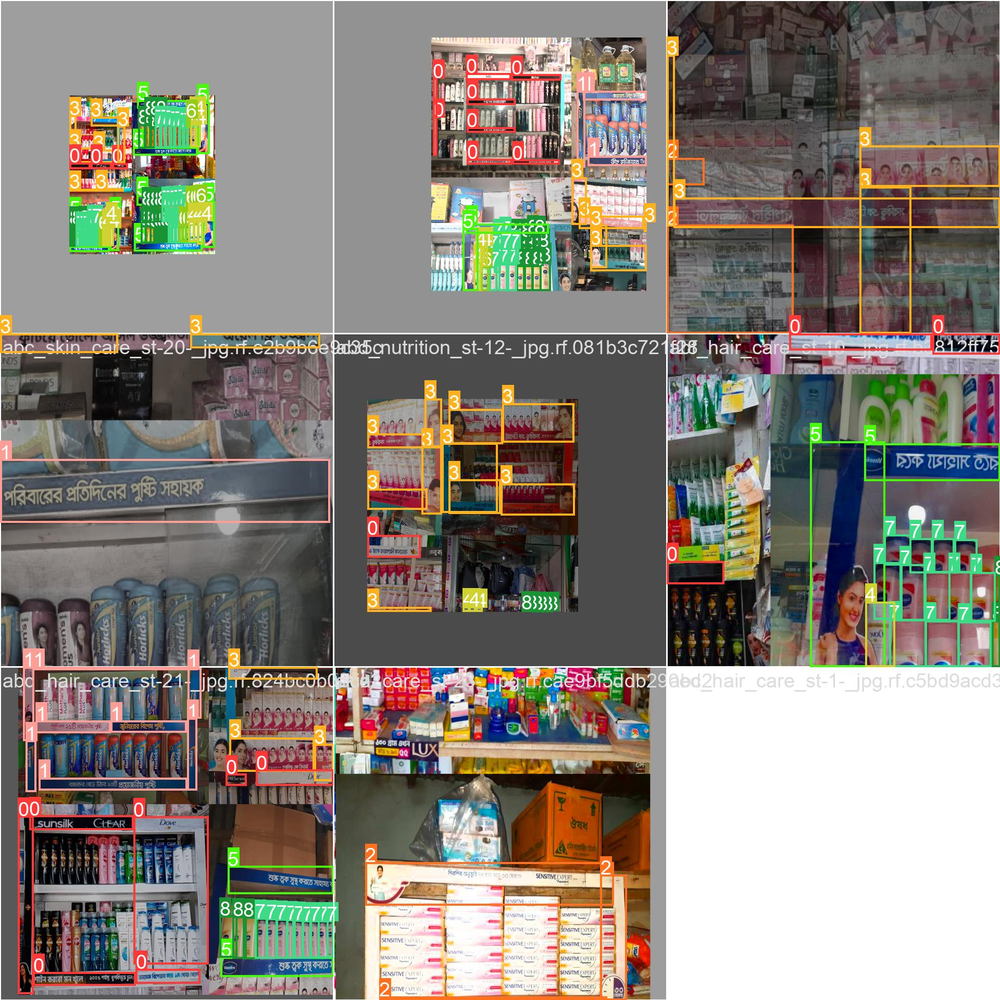

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/train3/train_batch0.jpg'
img = Image.open(img_path)
display(img)

#Apply YOLOv8n Model

In [ ]:
%cd /content/drive/MyDrive/Academic/Final Defense/UBL POSM

!yolo task=detect mode=train model= yolov8n.pt data=data.yaml patience=300 epochs=50 imgsz=640 plots=True batch=8

/content/drive/MyDrive/Academic/Final Defense/UBL POSM
100% 6.23M/6.23M [00:00<00:00, 85.7MB/s]

Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=data.yaml, epochs=50, patience=300, batch=8, imgsz=640, save=True, cache=False, device=, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchsc

Validate Custom Model for YOLOv8n

In [ ]:
!yolo task=detect mode=val model=runs/detect/train4/weights/best.pt data=data.yaml

2024-01-20 18:01:02.373467: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-20 18:01:02.373525: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-20 18:01:02.375022: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-20 18:01:03.460510: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3007403 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/drive/MyDrive/Academic/Final Defense/UBL POSM/UBL-4/

Inference with Custom Model for YOLOv8n

In [ ]:
!yolo task=detect mode=predict model=runs/detect/train4/weights/best.pt conf=0.25 source=UBL-4/test/images

2024-01-20 18:02:10.699370: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-20 18:02:10.699428: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-20 18:02:10.701274: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-20 18:02:12.210992: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3007403 parameters, 0 gradients, 8.1 GFLOPs
image 1/207 /content/drive/MyDrive/Academic/Final Defense/UBL POSM/UBL-4/te

Results

In [ ]:
!ls runs/detect/val4

confusion_matrix.png  PR_curve.png	     val_batch0_pred.jpg    val_batch2_labels.jpg
F1_curve.png	      R_curve.png	     val_batch1_labels.jpg  val_batch2_pred.jpg
P_curve.png	      val_batch0_labels.jpg  val_batch1_pred.jpg


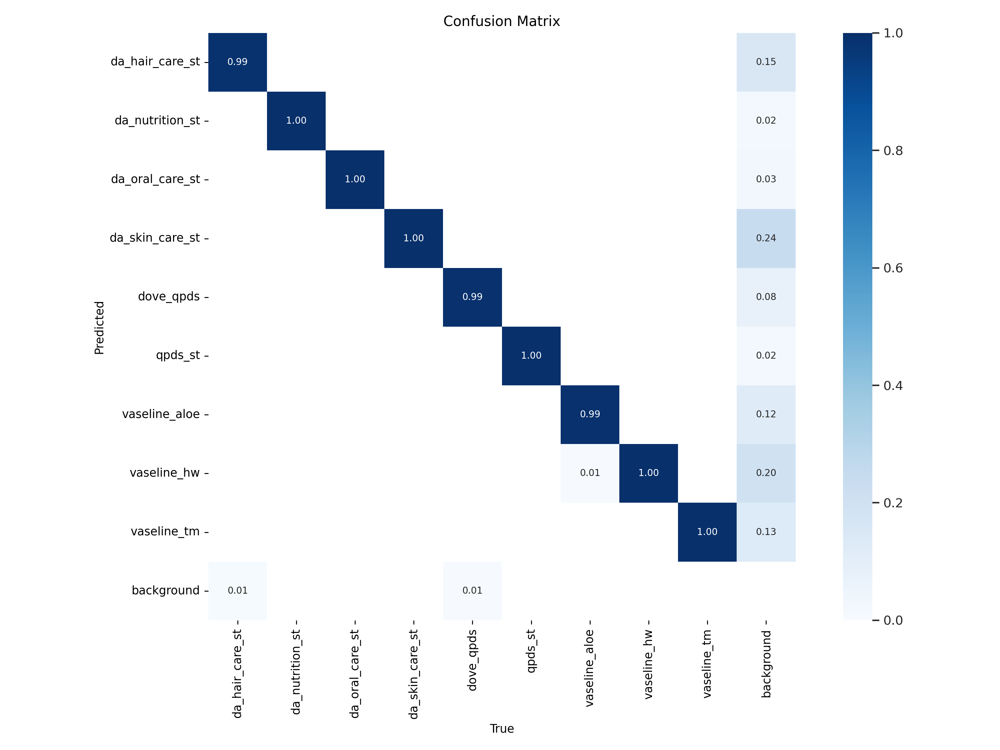

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/val4/confusion_matrix.png'
img = Image.open(img_path)
display(img)

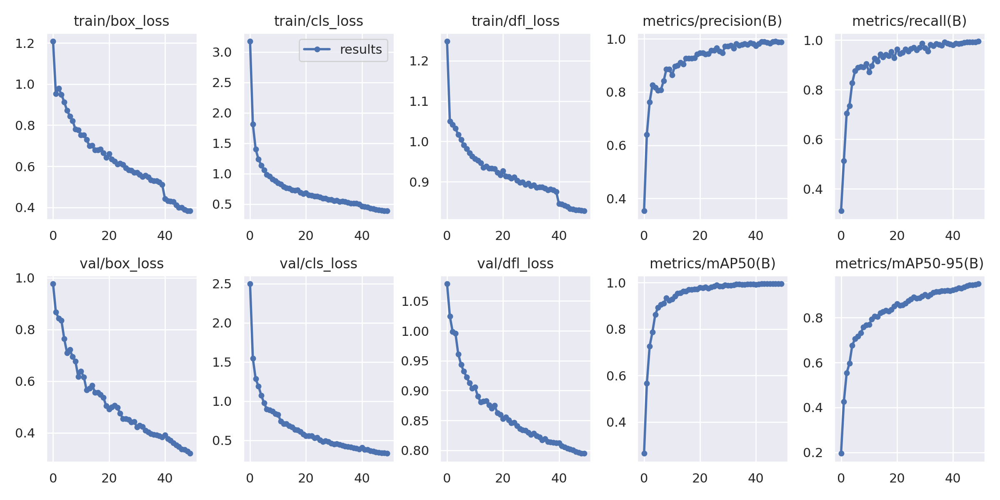

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/train4/results.png'
img = Image.open(img_path)
display(img)

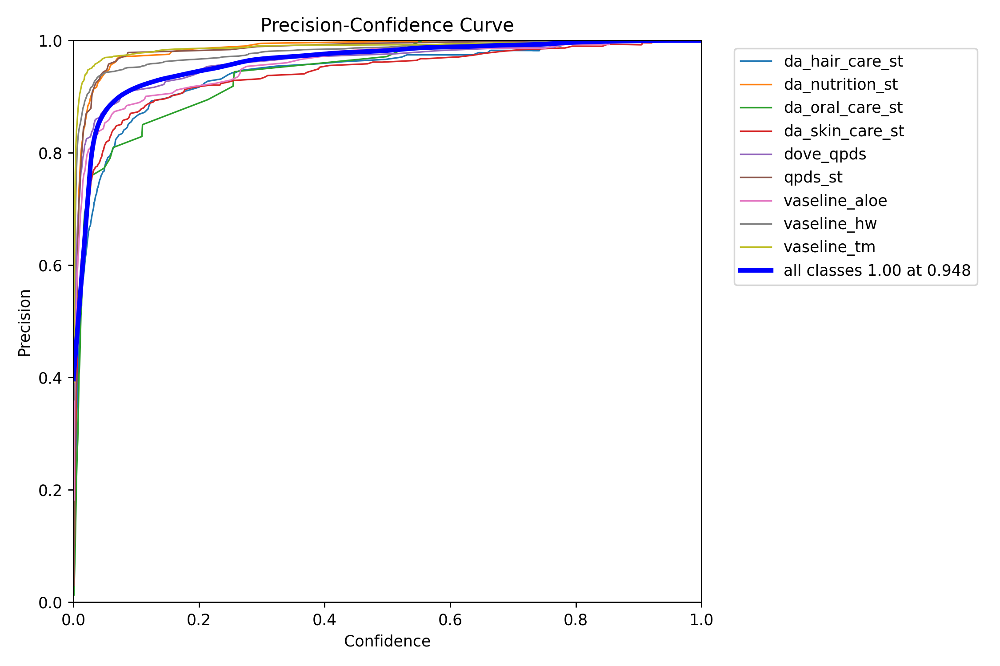

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/val4/P_curve.png'
img = Image.open(img_path)
display(img)

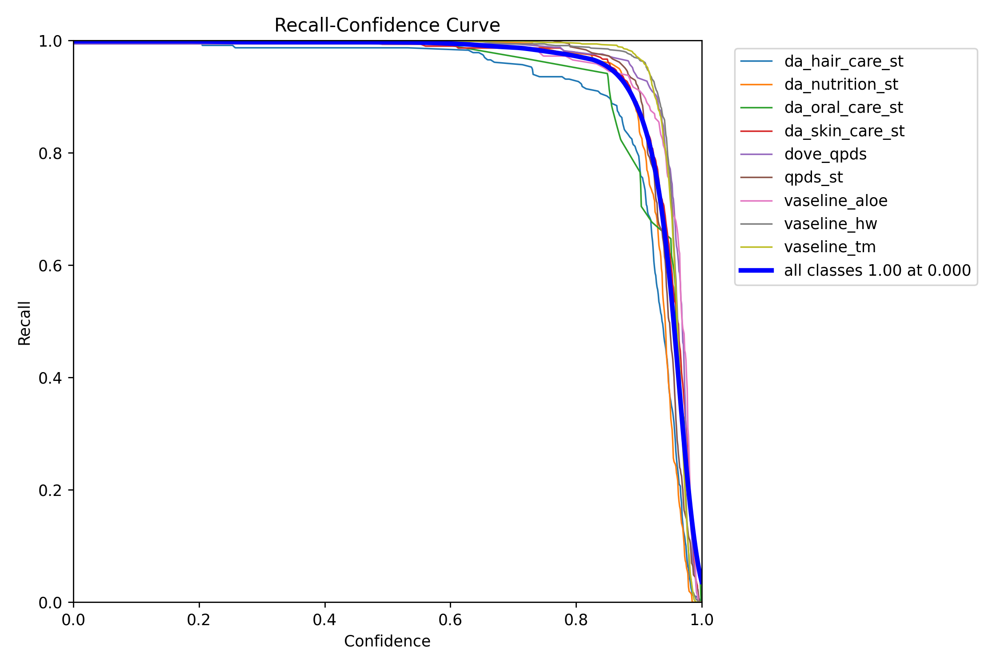

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/val4/R_curve.png'
img = Image.open(img_path)
display(img)

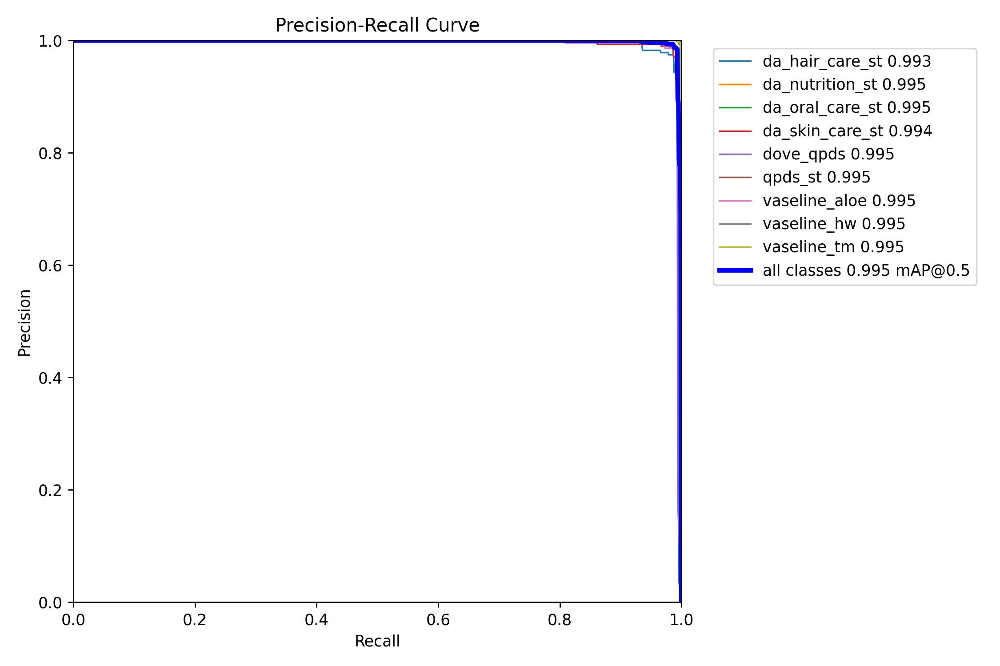

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/val4/PR_curve.png'
img = Image.open(img_path)
display(img)

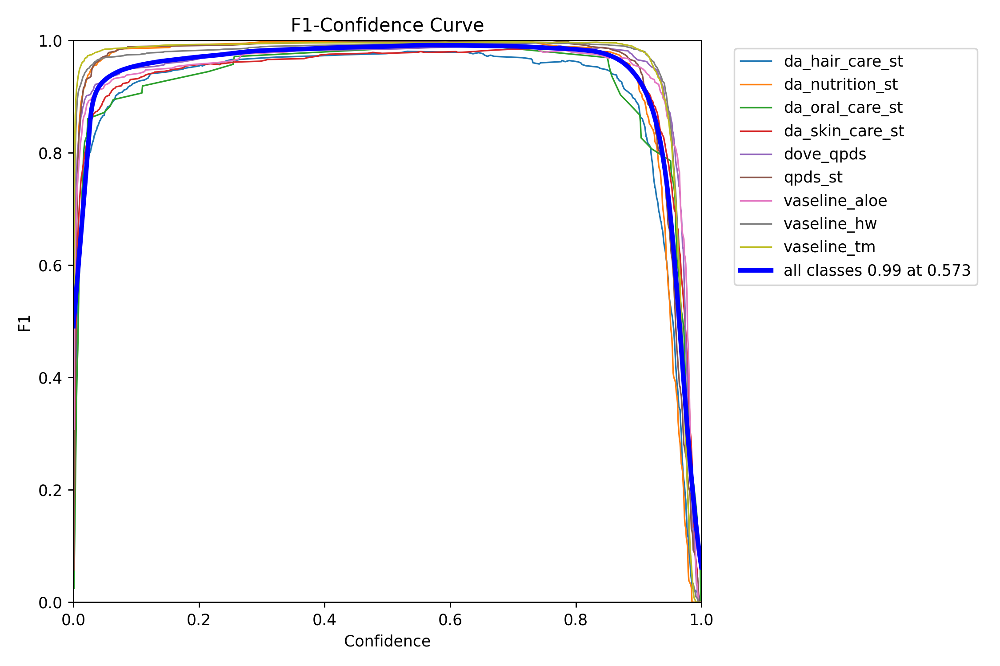

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/val4/F1_curve.png'
img = Image.open(img_path)
display(img)

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/train4/train_batch0.jpg'
img = Image.open(img_path)
display(img)

#Apply YOLOv8s Model

In [ ]:
%cd /content/drive/MyDrive/Academic/Final Defense/UBL POSM

!yolo task=detect mode=train model= yolov8s.pt data=data.yaml patience=300 epochs=50 imgsz=640 plots=True batch=8

/content/drive/MyDrive/Academic/Final Defense/UBL POSM
100% 21.5M/21.5M [00:00<00:00, 137MB/s]

Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.yaml, data=data.yaml, epochs=50, patience=300, batch=8, imgsz=640, save=True, cache=False, device=, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscr

Validate Custom Model for YOLOv8s

In [ ]:
!yolo task=detect mode=val model=runs/detect/train5/weights/best.pt data=data.yaml

2024-01-20 18:03:22.809333: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-20 18:03:22.809393: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-20 18:03:22.810713: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-20 18:03:23.853070: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11129067 parameters, 0 gradients, 28.5 GFLOPs
val: Scanning /content/drive/MyDrive/Academic/Final Defense/UBL POSM/UBL-

In [ ]:
!yolo task=detect mode=predict model=runs/detect/train5/weights/best.pt conf=0.25 source=UBL-4/test/images

2024-01-16 16:46:30.014376: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-16 16:46:30.014422: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-16 16:46:30.015724: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-16 16:46:31.114859: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11129067 parameters, 0 gradients, 28.5 GFLOPs
image 1/207 /content/drive/MyDrive/Academic/Final Defense/UBL POSM/UBL-4/

Results

In [ ]:
!ls runs/detect/val6

confusion_matrix.png  PR_curve.png	     val_batch0_pred.jpg    val_batch2_labels.jpg
F1_curve.png	      R_curve.png	     val_batch1_labels.jpg  val_batch2_pred.jpg
P_curve.png	      val_batch0_labels.jpg  val_batch1_pred.jpg


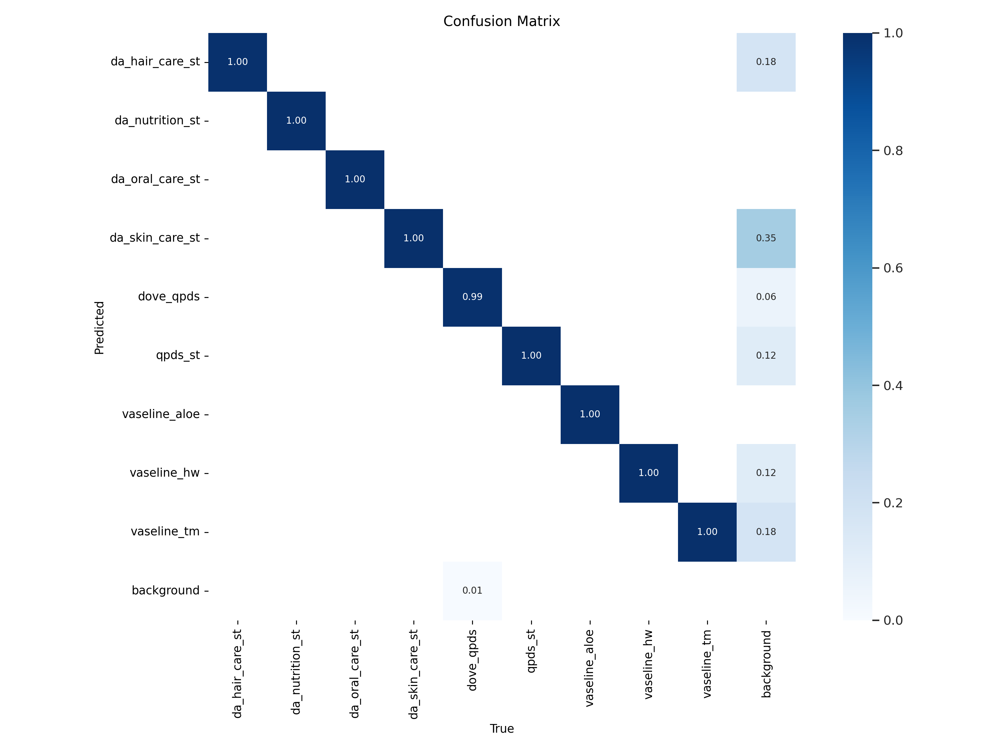

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/val6/confusion_matrix.png'
img = Image.open(img_path)
display(img)

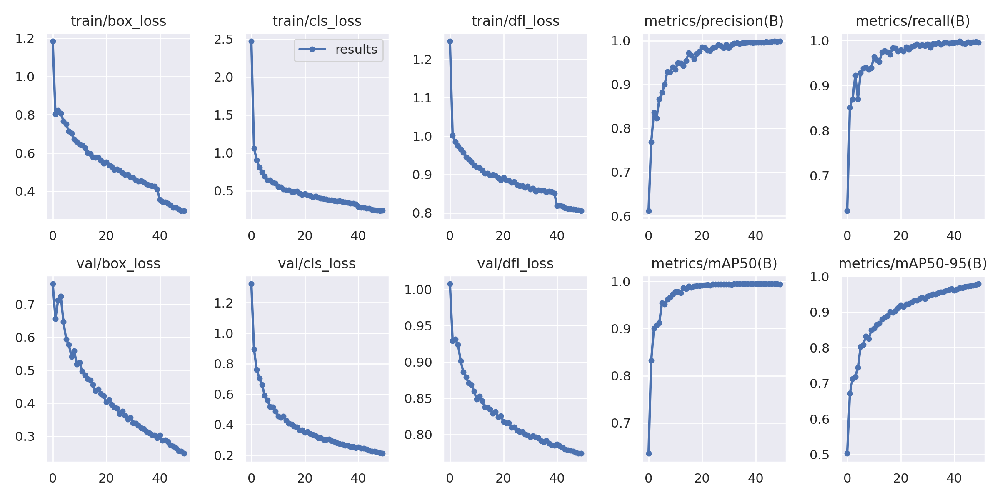

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/train5/results.png'
img = Image.open(img_path)
display(img)

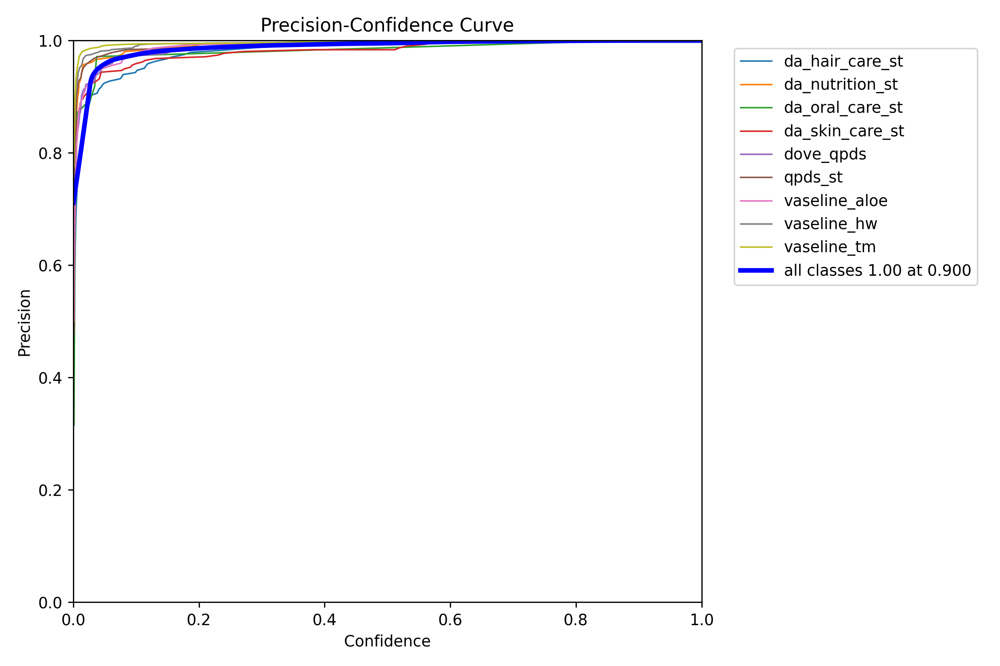

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/val6/P_curve.png'
img = Image.open(img_path)
display(img)

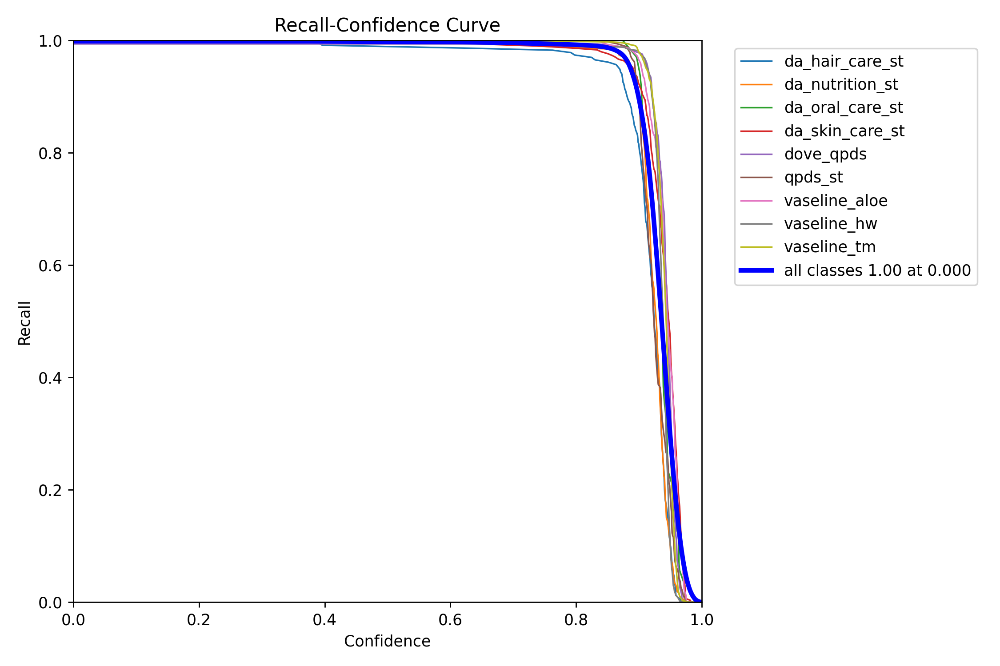

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/val6/R_curve.png'
img = Image.open(img_path)
display(img)

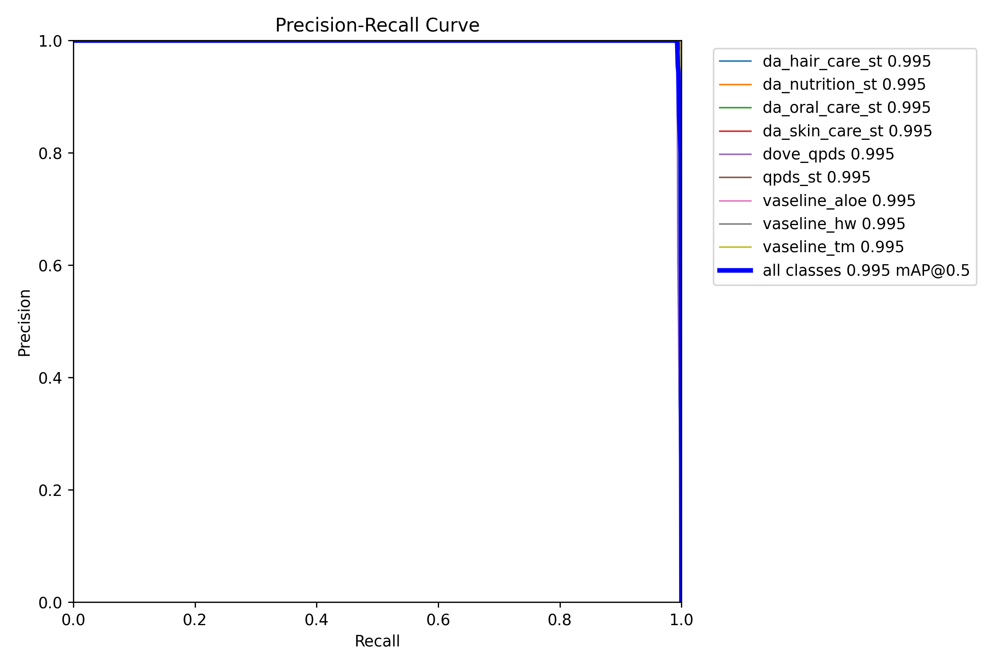

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/val6/PR_curve.png'
img = Image.open(img_path)
display(img)

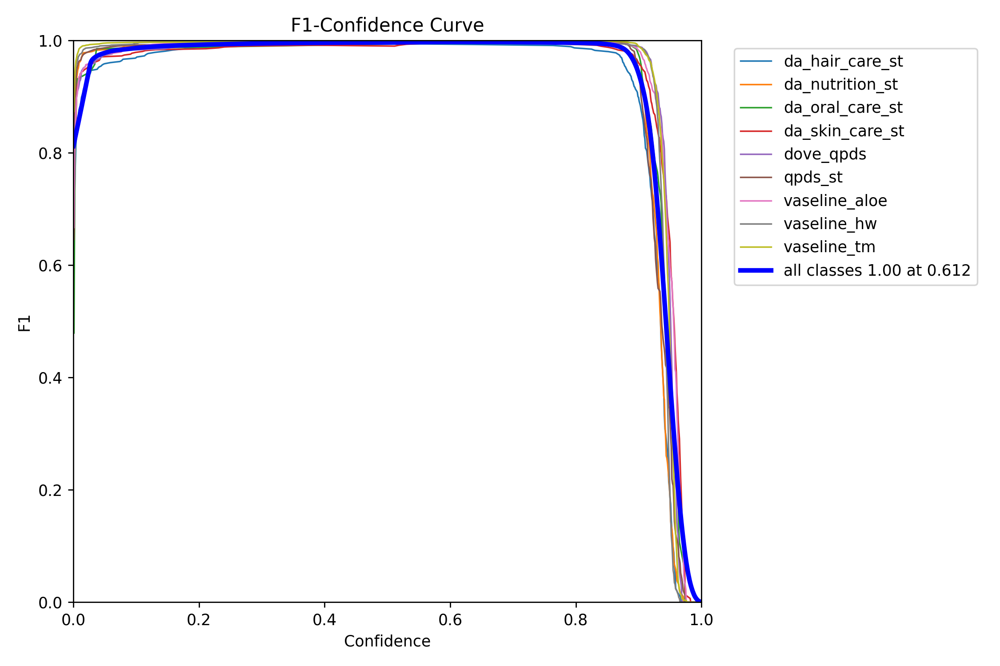

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/val6/F1_curve.png'
img = Image.open(img_path)
display(img)

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/train5/train_batch0.jpg'
img = Image.open(img_path)
display(img)

#Extra

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/train/confusion_matrix.png'
img = Image.open(img_path)
display(img)

FileNotFoundError: ignored

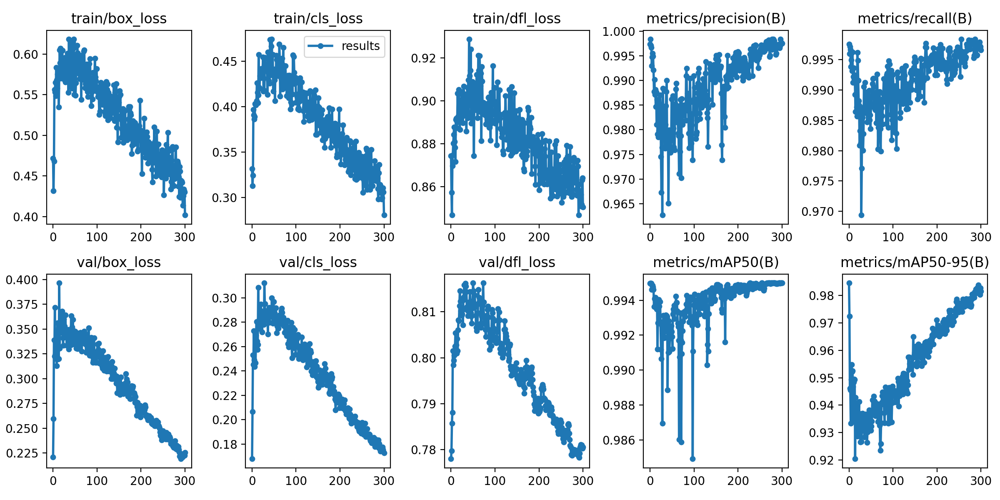

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/train/results.png'
img = Image.open(img_path)
display(img)

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/train/train_batch0.jpg'
img = Image.open(img_path)
display(img)

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/train/train_batch1.jpg'
img = Image.open(img_path)
display(img)

In [ ]:
from PIL import Image
from IPython.display import display

img_path = 'runs/detect/train/train_batch2.jpg'
img = Image.open(img_path)
display(img)

## Validate Custom Model

In [ ]:
!yolo task=detect mode=val model=runs/detect/train/weights/best.pt data=data.yaml

2023-12-23 09:39:52.830890: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-23 09:39:52.830984: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-23 09:39:52.833452: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-23 09:39:54.137485: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu121 CPU
Model summary (fused): 268 layers, 43613547 parameters, 0 gradients, 164.9 GFLOPs
100% 755k/755k [00:00<00:00, 21.9MB/s]
val: Scanning /content/drive/MyDrive/UBL POSM/UBL-4/train

## Inference with Custom Model

In [ ]:
!yolo task=detect mode=predict model=runs/detect/train/weights/best.pt conf=0.25 source=UBL-4/train/images

2023-12-23 09:51:22.520697: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-23 09:51:22.520765: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-23 09:51:22.521836: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-23 09:51:23.493494: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu121 CPU
Model summary (fused): 268 layers, 43613547 parameters, 0 gradients, 164.9 GFLOPs
image 1/207 /content/drive/MyDrive/UBL POSM/UBL-4/train/images/hair_care_st-1-_jpg.rf.c5bd9acd3e

**NOTE:** Let's take a look at few results.

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob('runs/detect/predict/*.jpg')[:3]:
      display(Image(filename=image_path, width=600))
      print("\n")